# LLM Basics for Healthcare Professionals

## A simple, hands-on workshop with fictional healthcare examples

This notebook explains how large language models (LLMs) work using plain language, simple diagrams, and small Python examples.



### Learning goals

1. See how text becomes tokens and numbers.
2. Understand parameters, embeddings, attention, and next-token prediction.
3. See how training reduces errors.
4. Explore retrieval-augmented generation (RAG), agents, MCP, and A2A.
5. Practice safe, responsible use in healthcare.

> **Safety check:** Everything here is educational. All people, notes, policies, and messages are fictional. Never use these examples for diagnosis, treatment, medication dosing, or real patient care. Never enter protected health information (PHI) into an unapproved tool.

---
# The GenAI Landscape — Model Creators and Model Users

The LLM landscape has two broad roles: **organizations that create and train models**, such as OpenAI, Anthropic, Meta, Google, and xAI; and **people and organizations that use those models** for everyday tasks such as programming, writing, and summarizing. The same organization can play both roles.

**This workshop covers both:** understanding how LLMs work and practicing how to use them.



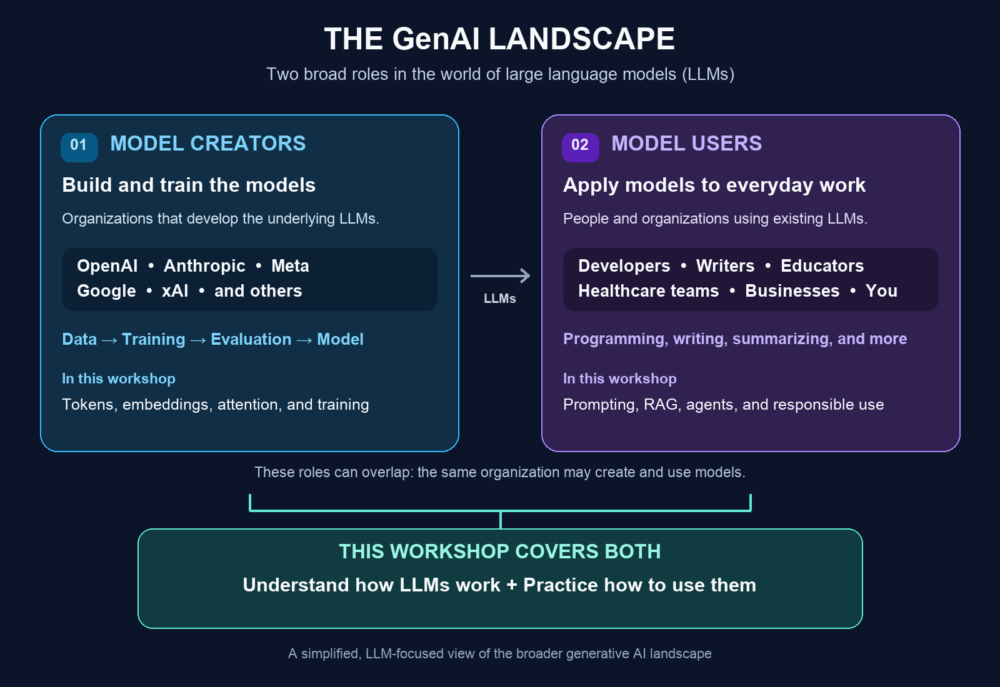

---
# Machine Learning and Generative AI — Same Family, Different Jobs





**Plain-language takeaway:** Generative AI is not separate from Machine Learning. It is a specialized part of the same AI family, designed to create new content from patterns learned in data.

> **Healthcare safety:** Prediction and generation can both be wrong. Never use these workshop examples for diagnosis, treatment, medication dosing, or real patient-care decisions.

---
# The Rapid Evolution of LLMs — 2022 to Today





**Plain-language takeaway:** LLMs changed quickly—from answering text questions to working with images, audio, documents, and tools. Human verification remains necessary at every stage.

> **Timeline note:** This is a simplified educational overview through July 2026. Model availability and capabilities vary by provider, product, region, and date.

## 0. Ground Rules and Helper Functions

- Run cells from top to bottom.
- Change only fictional examples.
- Treat every LLM response as a draft requiring review.
- Follow your organization's privacy, security, and AI policies.

**Important mental model:** An LLM predicts likely text. It does not know a patient, independently verify facts, or replace clinical judgment.

In [1]:
import math
import random
import re
from collections import Counter


def simple_tokenize(text):
    """Split text into simple lowercase word tokens."""
    return re.findall(r"\b\w+\b", text.lower())


def softmax(scores):
    """Turn scores into proportions that add up to 1."""
    shifted = [score - max(scores) for score in scores]
    values = [math.exp(score) for score in shifted]
    total = sum(values)
    return [value / total for value in values]


def bar_chart(label, value, max_value=1.0, width=24):
    """Print a small text bar chart."""
    filled = round((value / max_value) * width) if max_value else 0
    filled = max(0, min(width, filled))
    print(f"{label:<18} |{'#' * filled}{'-' * (width - filled)}| {value:.3f}")


def bag_of_words(text, vocabulary):
    """Create a simple word-count vector (not a learned embedding)."""
    counts = Counter(simple_tokenize(text))
    return [counts[word] for word in vocabulary]


def cosine_similarity(vector_a, vector_b):
    """Compare two vectors; 1 means same direction, 0 means no overlap."""
    dot = sum(a * b for a, b in zip(vector_a, vector_b))
    length_a = math.sqrt(sum(a * a for a in vector_a))
    length_b = math.sqrt(sum(b * b for b in vector_b))
    return dot / (length_a * length_b) if length_a and length_b else 0.0


random.seed(7)
print("Helpers loaded. All examples use fictional data.")

Helpers loaded. All examples use fictional data.


---
# 1. Tokens — How an LLM Reads Text

A **token** is a small piece of text. Real tokenizers may use words, punctuation, or parts of words. To keep this workshop simple, we use lowercase words.



### The Original LEGO Analogy

The same token idea can also be pictured as LEGO bricks: small pieces are processed and combined into a complete output.

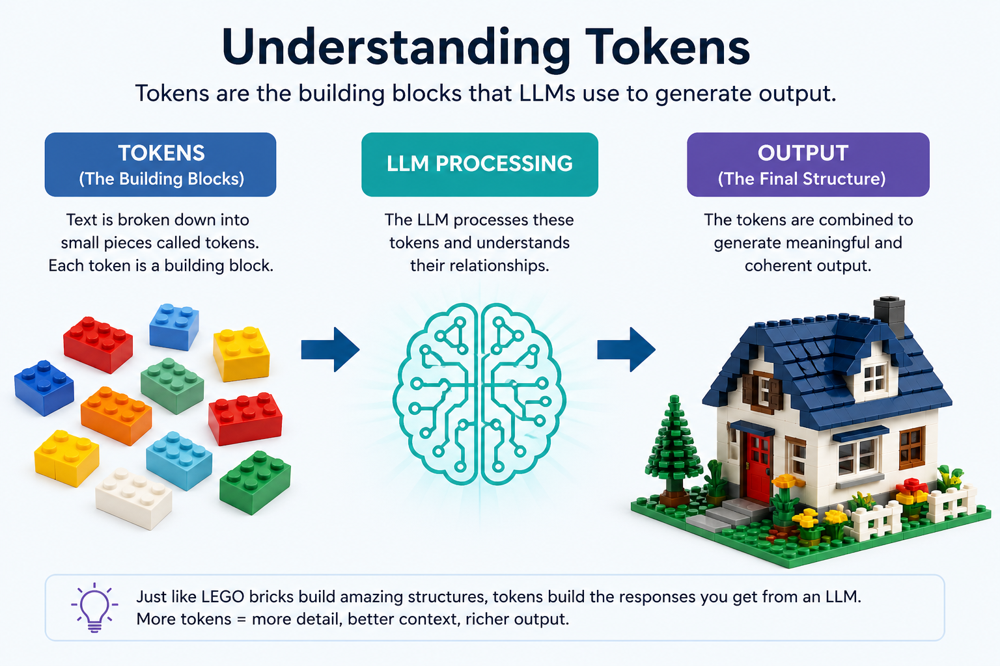

> **Healthcare connection:** A clinical message is also divided into small token pieces before the model processes it. The LEGO picture explains the general concept; the healthcare token picture below applies it to a fictional appointment message.



### Healthcare Token Analogy





**Healthcare connection:** A long clinical note uses many tokens. More tokens require more processing and may exceed a model's working context.

> **Safety check:** Tokenization does not remove identifiers. A patient's name split into tokens is still PHI.

In [15]:
message = "Your appointment is Monday at 10 AM."
tokens = simple_tokenize(message)

print("Fictional message:", message)
print("Tokens:", tokens)
print("Token count:", len(tokens))

Fictional message: Your appointment is Monday at 10 AM.
Tokens: ['your', 'appointment', 'is', 'monday', 'at', '10', 'am']
Token count: 7


## Key Idea

<div style="background:#1565c0;color:#ffffff;padding:18px 22px;border-radius:10px;margin:20px 0;font-size:1.1em;line-height:1.6;">
<strong>🔑 The main point:</strong><br><br>
An LLM does not process a clinical message as one complete thought. It first divides the text into small numbered pieces called <strong>tokens</strong>. Everything the model reads and writes is built from these pieces.
</div>

> **Healthcare connection:** A discharge instruction, appointment message, policy, or fictional clinical note is converted into tokens before the model processes it.

---



## What Counts as One Token?

In a real LLM, a token may be:

- A short common word: `the`, `is`, `patient`
- Part of a longer word: `cardio` + `vascular`
- A punctuation mark: `.`, `,`, `:`
- A number or part of a number: `10`, `00`
- A symbol or space pattern

For this workshop, the Python examples mostly use whole lowercase words. Real tokenizers are more detailed, so their token counts may differ.

**Healthcare example:** `Appointment: Monday at 10:00 AM` may split words, punctuation, and numbers into separate tokens.

---



## Why Not Use Only Whole Words or Individual Letters?

| Approach | Example: `cardiovascular` | Main limitation |
|---|---|---|
| **Individual characters** | `c`, `a`, `r`, `d`, `i`, ... | Creates very long sequences and requires more processing |
| **Whole words** | `cardiovascular` | New, rare, misspelled, or specialized terms may not be in the vocabulary |
| **Subwords** ✅ | `cardio` + `vascular` | Handles unfamiliar terms while keeping sequences reasonably short |

Most modern LLMs use subword tokenization. Common words may stay together, while uncommon clinical terms, medication names, abbreviations, or misspellings may be divided into several pieces.

> **Safety check:** Splitting a medical term into tokens does not mean the model understands its clinical meaning.

---



## Surprising Tokenization Facts

- **A person's name may become several tokens.** Tokenization does not anonymize it; the name is still PHI.
- **Medical terminology may use many tokens.** A rare condition or medication name can be divided into multiple subwords.
- **Punctuation and spacing matter.** `10:00 AM`, `10 AM`, and `10AM` may produce different tokens.
- **Abbreviations can be ambiguous.** The same letters may mean different things in different specialties.
- **Different languages tokenize differently.** The English rule of thumb may not work for multilingual healthcare content.
- **Long notes consume many tokens.** Repeated headers, copied-forward text, and large policy documents increase the total.

---



## Why Does Vocabulary Size Matter?

A model's **vocabulary** is the fixed set of token pieces its tokenizer recognizes. A larger vocabulary can represent more common words and text patterns with fewer pieces, but it also increases the number of possible next-token choices.

For healthcare professionals, this means:

- A familiar word such as `patient` may be one token.
- A specialized term may be split into several tokens.
- A new medication or uncommon name can still be represented by smaller pieces.
- More pieces use more of the model's context window.

Vocabulary size affects efficiency, but it does **not** guarantee medical knowledge, accuracy, or safety.

---



## The Cost Angle in Production AI

Many hosted AI services charge for the number of **input tokens** and **output tokens** processed. A short appointment message costs less to process than a long clinical document.

Healthcare examples that can increase token usage include:

- Long fictional clinical notes
- Multiple policy documents supplied to RAG
- Repeated instructions in a prompt
- Long generated summaries
- Large conversation histories

Reducing unnecessary text may lower cost and improve focus. Never remove clinically important context merely to save tokens, and always follow organizational policy.



<div style="background:#e65100;color:#ffffff;padding:18px 22px;border-radius:10px;margin:20px 0;font-size:1.1em;line-height:1.6;">
<strong>💰 Rule of thumb for English text:</strong><br><br>
1 token ≈ 4 characters, or about ¾ of a word.<br>
1,000 tokens ≈ 750 words, or roughly 1–2 pages of ordinary text.<br><br>
These are only estimates. Medical terms, numbers, abbreviations, formatting, and different languages can change the count.
</div>

> **Privacy reminder:** Token cost never changes the privacy rule—do not enter real PHI into an unapproved AI tool.

## 1A. Token IDs — Text Becomes Numbers

<div style="background:#b71c1c;color:#ffffff;padding:20px 24px;border-radius:8px;margin:20px 0;font-size:1.15em;line-height:1.7;box-shadow:0 4px 12px rgba(183,28,28,0.28);">
🚨 &nbsp;<strong style="font-size:1.15em;">The most important thing in this entire section:</strong><br><br>
<span style="font-size:1.3em;font-weight:bold;">An AI model NEVER actually sees words. It only ever sees NUMBERS.</span>
</div>

Every token receives a unique **token ID** from a lookup table called the **vocabulary**. The model performs mathematics using these numbers—it does not read text the way a healthcare professional does.

For example:

- A person sees the word `appointment`.
- The tokenizer may convert it to a number such as `102`.
- The model processes `102` and other token IDs through mathematical operations.
- The ID is only a label. It is **not** a clinical score, code, or diagnosis.

**Healthcare connection:** A fictional appointment message becomes a sequence of token IDs before the model processes it. Tokenization does not remove PHI or make sensitive text anonymous.



### LEGO Token-to-ID Picture

The original LEGO token-ID picture is adapted below using the fictional example **Your appointment is at Monday 10:00 AM**.



In [32]:
sentence = "Your appointment is at Monday 10:00 AM"

# The picture also shows the final punctuation mark as its own token.
tokens = ["Your", "appointment", "is", "at", "Monday", "10:00", "AM", "."]

vocabulary = {
    "Your": 101,
    "appointment": 102,
    "is": 103,
    "at": 104,
    "Monday": 105,
    "10:00": 106,
    "AM": 107,
    ".": 108,
}

token_ids = [vocabulary[token] for token in tokens]
id_to_token = {number: token for token, number in vocabulary.items()}
decoded_tokens = [id_to_token[number] for number in token_ids]

print("Fictional sentence:", sentence)
print("Tokens:", tokens)
print("Token IDs:", token_ids)
print("Decoded again:", decoded_tokens)

Fictional sentence: Your appointment is at Monday 10:00 AM
Tokens: ['Your', 'appointment', 'is', 'at', 'Monday', '10:00', 'AM', '.']
Token IDs: [101, 102, 103, 104, 105, 106, 107, 108]
Decoded again: ['Your', 'appointment', 'is', 'at', 'Monday', '10:00', 'AM', '.']


---
# 2. Embeddings — A Numeric Map of Meaning

A learned **embedding** represents text as a list of numbers. Similar meanings tend to be near each other in that numeric space.





The next code uses **word counts**, not learned embeddings. It is a transparent toy model that helps demonstrate vectors and similarity.

**Healthcare connection:** Real embeddings can help retrieve relevant approved policies or group administrative messages by meaning.

> **Safety check:** Similarity is not clinical correctness. Humans must check the retrieved source and context.

## The City Map Analogy

Think of every word or sentence as having an address on a very large map of meaning:

- `book appointment monday` and `change appointment monday` live in the same **scheduling neighborhood**.
- `request medical records` lives in a different **records neighborhood**.
- Finding similar text is like finding nearby addresses on the map.

A **token ID** is only a label, like a medical record shelf number. An **embedding** is a list of coordinates that describes where the text sits on the meaning map.

Real learned embeddings may use hundreds or thousands of coordinates. The code below intentionally uses a much simpler **word-count vector** so every number is easy to inspect.



### How the Current Healthcare Example Works

1. Build one shared vocabulary from the three fictional phrases.
2. Count whether each vocabulary word appears in each phrase.
3. Store those counts in the same order to create comparable vectors.
4. Use cosine similarity to compare the directions of those vectors.

> **Important limitation:** This teaching example mostly measures shared words. A real learned embedding can recognize that different words may express similar meaning.

> **Healthcare safety:** A nearby vector means “similar according to the representation,” not “clinically correct,” “safe,” or “appropriate for the same patient.”

In [35]:
phrases = [
    "book appointment monday",
    "change appointment monday",
    "request medical records",
]

phrase_vocabulary = sorted({word for phrase in phrases for word in simple_tokenize(phrase)})
vectors = [bag_of_words(phrase, phrase_vocabulary) for phrase in phrases]

print("Vocabulary:", phrase_vocabulary)
for phrase, vector in zip(phrases, vectors):
    print(f"{phrase!r} -> {vector}")

print("\nSimilarity:")
print("appointment phrases:", round(cosine_similarity(vectors[0], vectors[1]), 3))
print("appointment vs records:", round(cosine_similarity(vectors[0], vectors[2]), 3))

Vocabulary: ['appointment', 'book', 'change', 'medical', 'monday', 'records', 'request']
'book appointment monday' -> [1, 1, 0, 0, 1, 0, 0]
'change appointment monday' -> [1, 0, 1, 0, 1, 0, 0]
'request medical records' -> [0, 0, 0, 1, 0, 1, 1]

Similarity:
appointment phrases: 0.667
appointment vs records: 0.0


## 2B. Measuring Similarity with Cosine Similarity

Once we have embeddings (number lists), we can measure how **close** two phrases are.

We use **cosine similarity**:
- Result of **1.0** = identical direction (very similar representation)
- Result of **0.0** = perpendicular (unrelated in this example)
- Result of **-1.0** = opposite direction

Imagine two arrows on a map—cosine similarity measures the angle between them.



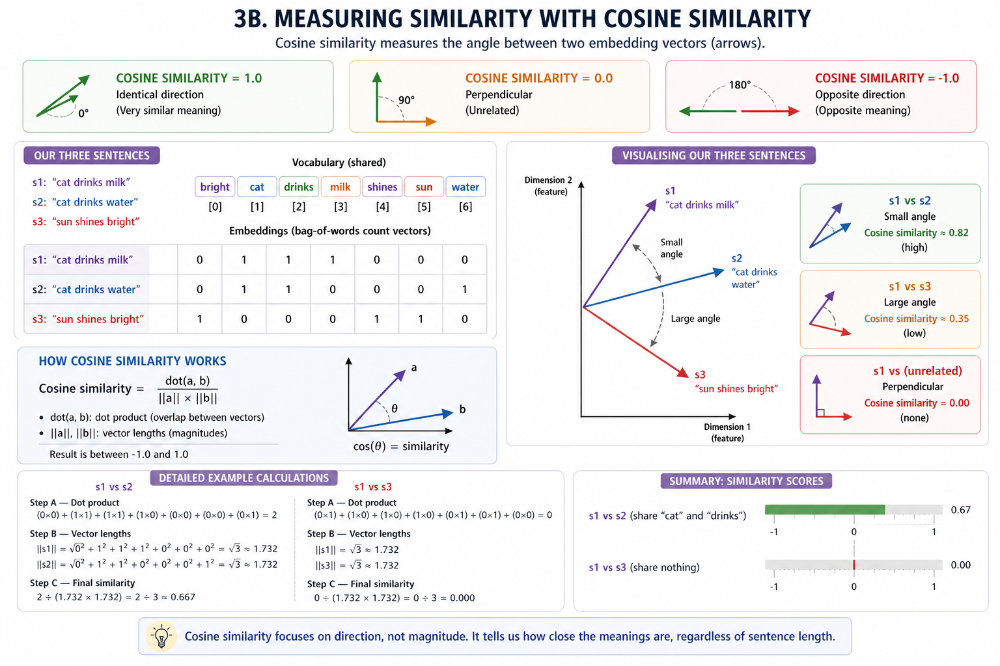



### The Big Idea

Real learned embeddings can place phrases with **different words but similar meanings** near one another. This supports:

- **Semantic search** — find approved documents by meaning rather than exact wording
- **RAG retrieval** — select relevant policies or guidance for a prompt
- **Administrative message grouping** — organize similar non-clinical requests

> **Healthcare safety:** A high similarity score is only a retrieval signal. It does not prove that a document is current, applicable, clinically correct, or authorized for the user. Always verify the source and context.

---
# 3. Parameters — Where the Model’s Knowledge Lives

A **parameter** is a number inside the model that was adjusted during training.



## The Radio Analogy

Imagine an old radio with many tuning knobs:

- Each **knob** is a parameter.
- Tuning the radio means adjusting knobs until the signal becomes clearer.
- **Training** adjusts very many parameters to reduce prediction errors.
- After training, the learned parameter values are stored as numbers.



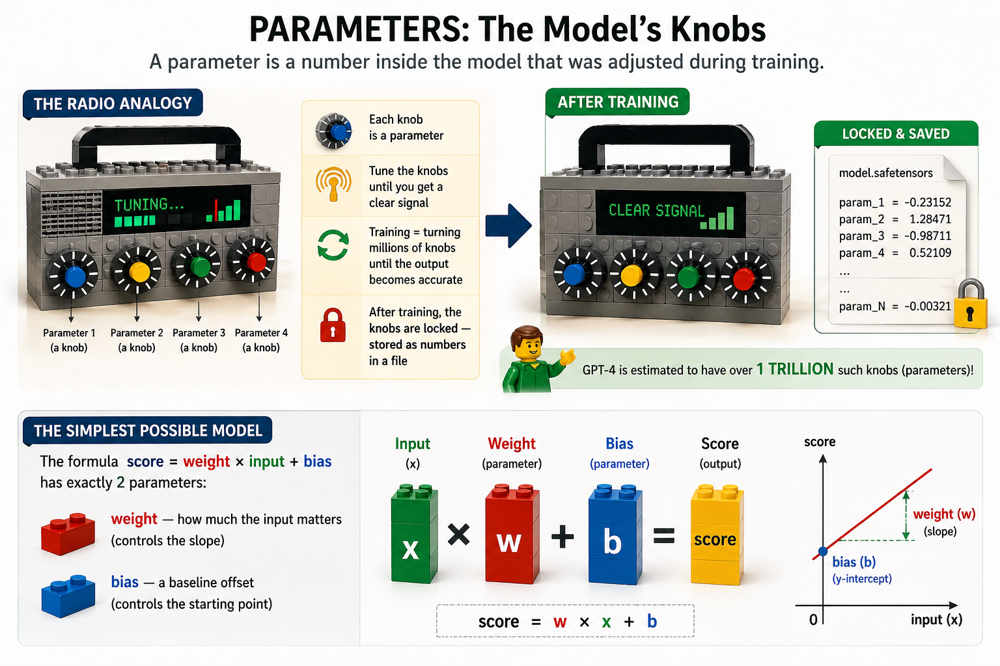



## The Simplest Possible Model

The formula `score = weight × input + bias` has exactly two parameters:

- `weight` — how much the input affects the output
- `bias` — a baseline adjustment

This tiny calculation is one building block used inside much larger neural networks.



## The Scale of Real Models

Our healthcare teaching model below has only **2 parameters**: a weight and a bias.

Real language models combine millions or billions of learned parameters. The table includes several recent model families and is updated through **July 2026**.

| Model | Publicly reported or released parameter scale | What to notice |
|---|---:|---|
| GPT-3 | 175 billion | Historical dense-model example |
| [Llama 4 Scout](https://ai.meta.com/blog/llama-4-multimodal-intelligence/) | 109 billion total; 17 billion active per token | Mixture-of-experts model |
| [Llama 4 Maverick](https://ai.meta.com/blog/llama-4-multimodal-intelligence/) | 400 billion total; 17 billion active per token | Large model, but only part is active for each token |
| [DeepSeek-V3](https://arxiv.org/abs/2412.19437) | 671 billion total; 37 billion active per token | Mixture-of-experts model |
| [Qwen3-235B-A22B](https://qwenlm.github.io/blog/qwen3/) | 235 billion total; 22 billion active per token | The name shows total and active scale |
| [GPT-5.6 Sol, Terra, and Luna](https://openai.com/index/gpt-5-6/) | Not publicly disclosed | Recent proprietary family; model size is private |
| [Gemini 3.6 Flash](https://blog.google/innovation-and-ai/models-and-research/gemini-models/gemini-3-6-flash-3-5-flash-lite-3-5-flash-cyber/) | Not publicly disclosed | Recent proprietary efficiency-focused model |



### Why Do Some Models Have Two Parameter Numbers?

Some newer models use **Mixture of Experts (MoE)**:

- **Total parameters** = all parameters stored in the model.
- **Active parameters** = the smaller subset used to process one token.
- Activating only part of the model can reduce computing cost and response time.

Some companies do not publish parameter counts for proprietary models. **Not publicly disclosed** is more accurate than relying on unofficial estimates.



Model names and availability change quickly. Always check the provider’s current documentation before making architecture, capability, or cost decisions.

More parameters can represent more language patterns, but parameter count alone does not determine quality, accuracy, speed, cost, or safety.

> **Healthcare connection:** Parameters may encode patterns learned from training data, including errors or bias. They are not a verified clinical database and must not replace approved sources or professional judgment.

> **Safety check:** A confident output can still be incomplete, outdated, or incorrect. Verify consequential healthcare information against current approved sources.

In [33]:
def tiny_model(input_value, weight, bias):
    """A tiny two-parameter teaching model."""
    return weight * input_value + bias

# Fictional administrative example: estimate forms processed.
forms_received = 4
weight = 2.0
bias = 1.0
prediction = tiny_model(forms_received, weight, bias)

print("Input:", forms_received, "fictional form batches")
print("Parameters: weight =", weight, ", bias =", bias)
print("Toy output:", prediction)
print("This is arithmetic for learning—not a clinical prediction.")

Input: 4 fictional form batches
Parameters: weight = 2.0 , bias = 1.0
Toy output: 9.0
This is arithmetic for learning—not a clinical prediction.


### Parameters Control the Output

The input can stay exactly the same while different parameter values produce different outputs. During training, the model searches for parameter values that reduce its errors.

The next example keeps the fictional input at **4 form batches** and changes only the `weight` and `bias`.

> **Healthcare safety:** This is a simple arithmetic demonstration, not a staffing forecast, clinical prediction, or operational recommendation.

In [34]:
# Keep the fictional administrative input the same.
form_batches = 4

# Change only the model's two parameters.
parameter_examples = [
    (0.5, 0.0),
    (1.0, 0.0),
    (2.0, 1.0),
    (3.0, -2.0),
]

print(f"Same input every time: {form_batches} fictional form batches\n")
print(f"{'Weight':>8} {'Bias':>8} {'Toy output':>12}")
print("-" * 32)

for example_weight, example_bias in parameter_examples:
    toy_output = tiny_model(form_batches, example_weight, example_bias)
    print(f"{example_weight:>8.1f} {example_bias:>8.1f} {toy_output:>12.1f}")

print("\nKey lesson: the input did not change, but the output changed")
print("because the parameter values changed.")
print("Educational arithmetic only—not a healthcare prediction.")

Same input every time: 4 fictional form batches

  Weight     Bias   Toy output
--------------------------------
     0.5      0.0          2.0
     1.0      0.0          4.0
     2.0      1.0          9.0
     3.0     -2.0         10.0

Key lesson: the input did not change, but the output changed
because the parameter values changed.
Educational arithmetic only—not a healthcare prediction.


---
# 4. Attention — Which Words Matter in This Context?

This is the breakthrough idea behind the "Transformer" architecture that powers all modern LLMs.

<div style="background:linear-gradient(135deg,#111827,#312e81);border:2px solid #8b5cf6;border-left:9px solid #a78bfa;padding:18px 22px;border-radius:12px;margin:18px 0;color:#f8fafc;box-shadow:0 4px 14px rgba(0,0,0,0.38);">
  <div style="font-size:1.18em;font-weight:800;margin-bottom:8px;color:#e9d5ff;">📄 Landmark AI Paper</div>
  <a href="https://arxiv.org/abs/1706.03762" target="_blank" rel="noopener noreferrer" style="color:#facc15;font-size:1.12em;font-weight:800;text-decoration:underline;">Attention Is All You Need (2017)</a>
  <div style="margin-top:10px;line-height:1.55;color:#f8fafc;"><strong>One-line fact:</strong> This paper introduced the Transformer architecture that became the technical foundation for modern LLMs and today’s multibillion-dollar generative-AI industry.</div>
</div>



## Why This Paper Was a Big Deal

Imagine trying to understand a book by reading **one word at a time from beginning to end** and carrying everything in your memory. Older AI systems worked more like this, which made learning from long passages slower and more difficult.

The Transformer introduced a better approach. It is like quickly looking across a page, noticing the **important words and connections**, and using them to understand the story.

For example, if a page repeatedly mentions **hospital**, **doctor**, **appointment**, and **patient**, the AI learns that these words are connected and probably important to the meaning of that passage.



This helped AI:

- Examine many words together instead of only one after another.
- Focus on the words and connections that matter most.
- Understand larger amounts of text more efficiently.
- Train faster by doing more work at the same time on powerful computers.

<div style="background:linear-gradient(135deg,#0f766e,#115e59);border:2px solid #5eead4;border-left:9px solid #2dd4bf;padding:16px 20px;border-radius:12px;margin:18px 0;color:#f0fdfa;box-shadow:0 4px 12px rgba(0,0,0,0.30);">
  <strong style="color:#99f6e4;">💡 Central idea:</strong> This paper helped AI move from reading language mostly one step at a time to examining many words together, which helped make today’s LLMs possible.
</div>

<div style="background:#172033;border-left:6px solid #60a5fa;padding:13px 17px;border-radius:9px;margin:14px 0;color:#dbeafe;">
  <strong>Small accuracy note:</strong> An LLM does not literally scan an unlimited whole book at once. It examines the text that fits inside its available context window.
</div>



## The Doctor Analogy

Imagine a doctor reviewing a patient's medical file before a consultation.

- The file contains hundreds of data points — age, weight, shoe size, favourite colour, blood pressure, cholesterol, family history, sleep patterns...
- The doctor does **not** read every line with equal care
- When checking for heart disease, they immediately **spotlight** "cholesterol", "blood pressure", and "family history"
- They mostly **ignore** "shoe size" or "favourite colour" — those are irrelevant to the question at hand

Attention lets a model do exactly the same thing:
- For each word it is processing, it asks: *"which other words in this sentence are most relevant to me right now?"*
- It assigns high **attention weights** to relevant words and low weights to irrelevant ones
- It then builds its understanding by combining the weighted information



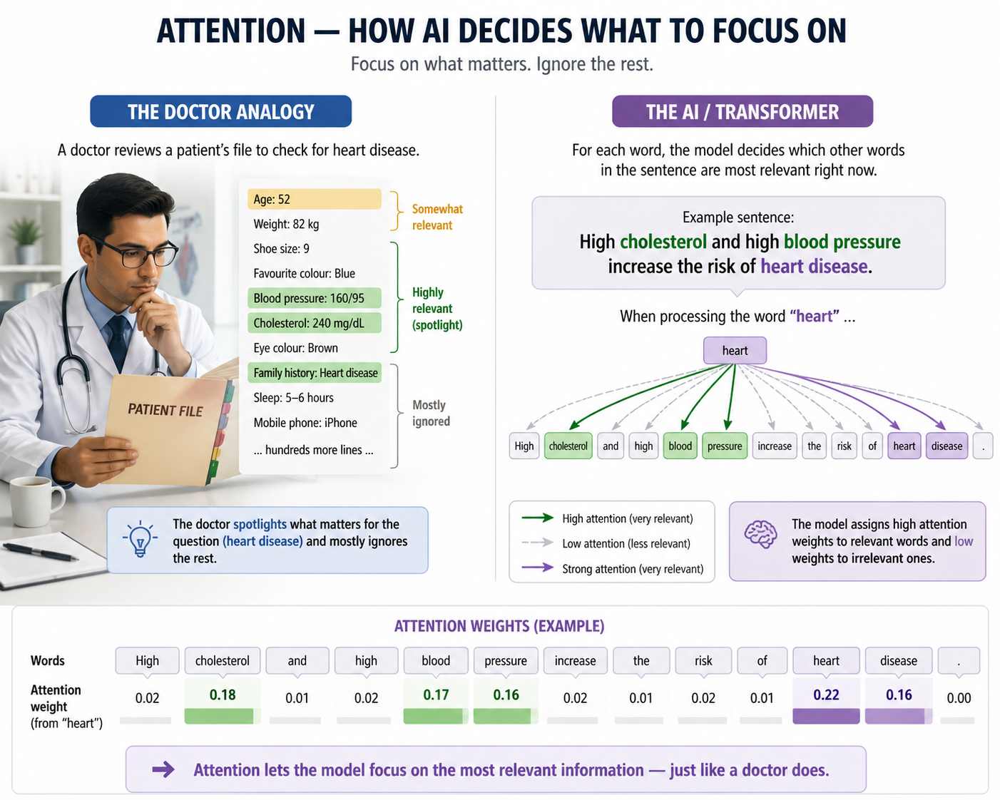

---



## Why Attention Solves a Hard Problem

A word can mean different things in different sentences. Consider the word **"discharge"**:

- *"The patient was ready for **discharge** from the hospital."* Here, discharge means leaving the hospital.
- *"The nurse documented **discharge** from the wound."* Here, discharge means fluid from the wound.

The word is spelled exactly the same way, but its meaning changes.



Without context, the model only sees the word `discharge`. With attention, it looks at the surrounding words:

- In the first sentence, `discharge` focuses strongly on `ready` and `hospital`.
- In the second sentence, `discharge` shifts its focus to `documented` and `wound`.

Think of attention as a set of **highlighter pens**. For every word, the model highlights the other words that are most useful at that moment.

> **Important:** The scores below are hand-written for teaching. A real Transformer learns attention patterns during training.

In [37]:
# ATTENTION: Which words help explain the target word?
#
# A real Transformer calculates attention scores automatically.
# Here, we write the scores ourselves so the idea is easy to see.

def show_attention(target_word, sentence_words, raw_relevance_scores):
    """Show the attention paid to each word while processing target_word."""
    attention_weights = softmax(raw_relevance_scores)
    max_weight = max(attention_weights)

    print(f"How much attention does '{target_word}' pay to each word?")
    print("Longer bar = more influence on the target word in this example.\n")

    for word, weight in zip(sentence_words, attention_weights):
        bar_chart(word, weight, max_value=max_weight)

    print()
    return attention_weights


# CONTEXT 1: "discharge" means leaving the hospital.
hospital_words = [
    "the", "patient", "was", "ready", "for",
    "discharge", "from", "the", "hospital",
]
hospital_scores = [0.1, 1.2, 0.2, 2.7, 0.1, 2.0, 0.2, 0.1, 3.3]

print("=" * 65)
print("SENTENCE 1: 'The patient was ready for discharge from the hospital.'")
print("=" * 65)
hospital_attention = show_attention(
    "discharge", hospital_words, hospital_scores
)
print("The strongest clues are 'hospital' and 'ready'.")
print("So 'discharge' means leaving the hospital.\n")


# CONTEXT 2: The same word now means fluid from a wound.
wound_words = [
    "the", "nurse", "documented", "discharge",
    "from", "the", "wound",
]
wound_scores = [0.1, 1.0, 2.0, 2.0, 0.1, 0.1, 3.5]

print("=" * 65)
print("SENTENCE 2: 'The nurse documented discharge from the wound.'")
print("=" * 65)
wound_attention = show_attention(
    "discharge", wound_words, wound_scores
)
print("The strongest clues are 'wound' and 'documented'.")
print("So 'discharge' means fluid from the wound.\n")

print("KEY INSIGHT:")
print("The word did not change. The surrounding context changed.")
print("Attention helps the model focus on the clues that change the meaning.")
print("These teaching scores do not represent clinical reasoning or causation.")

SENTENCE 1: 'The patient was ready for discharge from the hospital.'
How much attention does 'discharge' pay to each word?
Longer bar = more influence on the target word in this example.

the                |#-----------------------| 0.019
patient            |###---------------------| 0.057
was                |#-----------------------| 0.021
ready              |#############-----------| 0.255
for                |#-----------------------| 0.019
discharge          |#######-----------------| 0.126
from               |#-----------------------| 0.021
the                |#-----------------------| 0.019
hospital           |########################| 0.464

The strongest clues are 'hospital' and 'ready'.
So 'discharge' means leaving the hospital.

SENTENCE 2: 'The nurse documented discharge from the wound.'
How much attention does 'discharge' pay to each word?
Longer bar = more influence on the target word in this example.

the                |#-----------------------| 0.020
nurse              

## Attention: How AI Decides What to Focus On

The code above uses the same word, `discharge`, in two contexts. The bars make the model's changing spotlight visible.

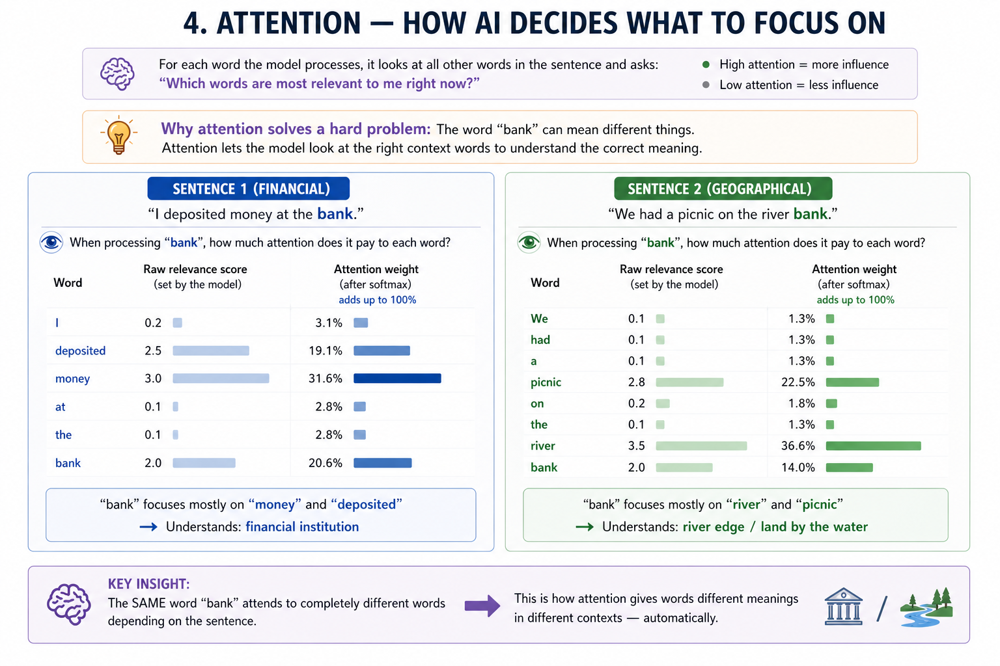



### What the Demonstration Shows

- In the hospital context, `discharge` gives the most attention to `hospital` and `ready`.
- In the wound context, `discharge` shifts its attention to `wound` and `documented`.
- The target word stays the same. The important surrounding words change.
- Softmax converts the hand-written scores into percentages that add up to 100%.

### One-Sentence Takeaway

> Attention helps each word look at the other words that matter most for understanding its current context.

> **Healthcare safety:** Attention weights show internal language relationships. They do not provide a diagnosis, clinical reasoning, or proof that one event caused another.

---
# 5. Next-Token Prediction — How Text Is Generated

An LLM repeatedly predicts a likely next token.

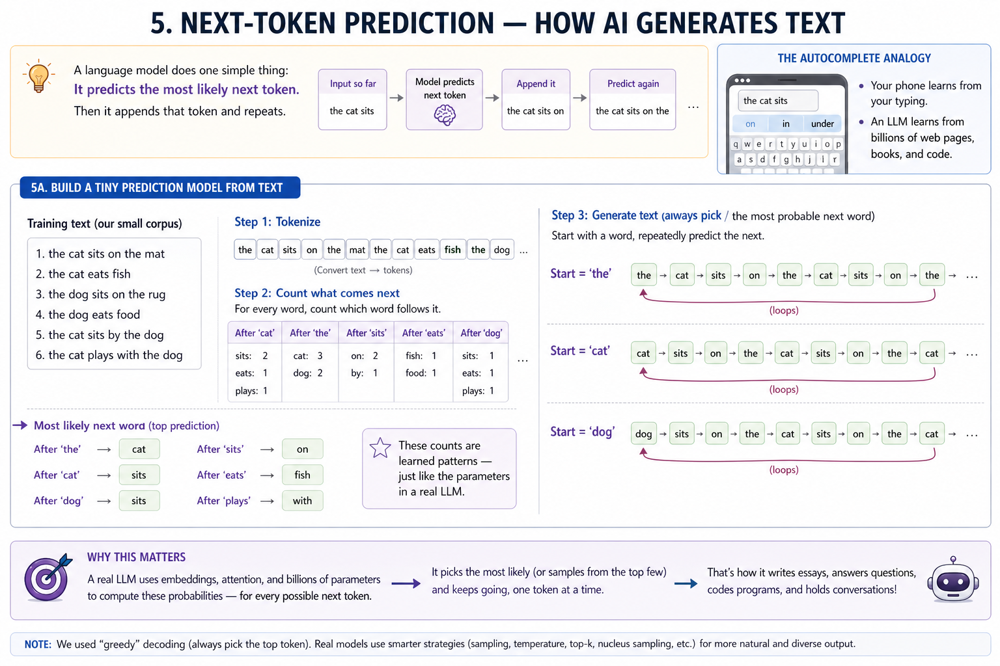



The model follows a short loop:

1. Read all tokens already written.
2. Calculate probabilities for possible next tokens.
3. Select one token.
4. Append that token to the text.
5. Repeat the process to generate the next token.

This is powerful autocomplete, not independent clinical understanding. A fluent sentence can still be wrong.

> **Safety check:** Never treat confidence of wording as confidence of medical evidence. Generated appointment details still need an approved source and human verification.

In [22]:
from collections import defaultdict

training_text = """
your appointment is monday
your appointment is confirmed
your appointment is monday
your visit is confirmed
"""

next_token_counts = defaultdict(Counter)
training_words = simple_tokenize(training_text)
for current_word, next_word in zip(training_words, training_words[1:]):
    next_token_counts[current_word][next_word] += 1

print("Words seen after 'appointment':")
for word, count in next_token_counts["appointment"].most_common():
    print(f"  {word}: {count}")

predicted = next_token_counts["appointment"].most_common(1)[0][0]
print("\nToy prediction: 'appointment' ->", predicted)

Words seen after 'appointment':
  is: 3

Toy prediction: 'appointment' -> is


---
# 6. Training and Loss — Learning from Examples

During training, a model:

1. Makes a prediction.
2. Measures the error, called **loss**.
3. Adjusts parameters slightly.
4. Repeats this many times.

The toy example below learns a simple administrative pattern: $y = 2x + 1$.

**Healthcare connection:** Training data quality matters. Missing groups, historical inequities, and labeling choices can create biased behavior.

> **Safety check:** Good average performance does not guarantee safe performance for every population or situation.

In [23]:
# Fictional administrative counts only: no patient-care prediction.
training_examples = [(1, 3), (2, 5), (3, 7), (4, 9)]
weight, bias = 0.5, 0.0
learning_rate = 0.02

for step in range(301):
    weight_gradient = 0.0
    bias_gradient = 0.0
    for input_value, correct_output in training_examples:
        error = tiny_model(input_value, weight, bias) - correct_output
        weight_gradient += 2 * error * input_value
        bias_gradient += 2 * error

    count = len(training_examples)
    weight -= learning_rate * weight_gradient / count
    bias -= learning_rate * bias_gradient / count

    if step in (0, 50, 100, 200, 300):
        loss = sum(
            (tiny_model(x, weight, bias) - y) ** 2
            for x, y in training_examples
        ) / count
        print(f"step={step:3}  weight={weight:.3f}  bias={bias:.3f}  loss={loss:.5f}")

step=  0  weight=1.050  bias=0.190  loss=11.27235
step= 50  weight=2.110  bias=0.677  loss=0.01745
step=100  weight=2.081  bias=0.761  loss=0.00957
step=200  weight=2.045  bias=0.869  loss=0.00288
step=300  weight=2.024  bias=0.928  loss=0.00087


---
# 7. RAG — Retrieval-Augmented Generation

A trained LLM knows only what it saw during training. It cannot know:
- What happened last week
- Your company's internal documents
- Your personal notes

**RAG** solves this by connecting the model to an external knowledge base at query time.



## Why RAG Is Needed — AI Hallucinations

Imagine asking someone a question they do not know. Instead of saying, “I don’t know,” they make a confident guess that sounds believable.

An LLM can do something similar.



### Simple Example

**Question:**

> “What time does Green Valley Clinic close on Fridays?”

The AI has no approved information about this fictional clinic, but it answers:

> “Green Valley Clinic closes at 8:00 PM on Fridays.”

The answer sounds clear and professional—but the AI **made up the closing time**.

This is called a **hallucination**: an AI response that sounds believable but is incorrect, invented, outdated, or unsupported by a reliable source.

<div style="background:linear-gradient(135deg,#7f1d1d,#991b1b);border:2px solid #f87171;border-left:9px solid #ef4444;padding:17px 21px;border-radius:12px;margin:18px 0;color:#fff7ed;box-shadow:0 4px 13px rgba(0,0,0,0.34);">
  <strong style="color:#fecaca;font-size:1.08em;">⚠️ Central idea:</strong> An LLM predicts words that sound likely. It does not automatically check whether those words are true.
</div>



### How RAG Helps

RAG gives the AI relevant, approved information **before** it creates an answer.

For the clinic-hours question, RAG could retrieve the current approved schedule. The AI can then answer from that schedule instead of guessing.

RAG can help by:

- Providing current and approved information.
- Asking the AI to answer only from retrieved sources.
- Including citations that people can verify.
- Allowing the AI to say, “I don’t know based on the approved sources.”



<div style="background:#172033;border-left:6px solid #f59e0b;padding:13px 17px;border-radius:9px;margin:14px 0;color:#fef3c7;">
  <strong>Important:</strong> RAG reduces hallucination risk, but it does not remove it completely. The system might retrieve the wrong document or describe it incorrectly. A qualified person must still verify important answers.
</div>

<div style="background:#172033;border-left:6px solid #60a5fa;padding:13px 17px;border-radius:9px;margin:14px 0;color:#dbeafe;">
  <strong>Terminology note:</strong> “Hallucination” is an AI term for unsupported or incorrect generated information. It does not mean that the AI thinks, sees, or deliberately lies.
</div>



## The Open-Book Exam Analogy

- A model without RAG = a student doing a **closed-book exam** — relies only on memory
- A model with RAG = a student doing an **open-book exam** — can look things up before answering



## The Three Steps of RAG

```
User question
     |
     v
[1. RETRIEVE]  -- search the knowledge base for relevant documents
     |
     v
[2. AUGMENT]   -- add the retrieved documents to the prompt
     |
     v
[3. GENERATE]  -- the model answers using the retrieved context
```



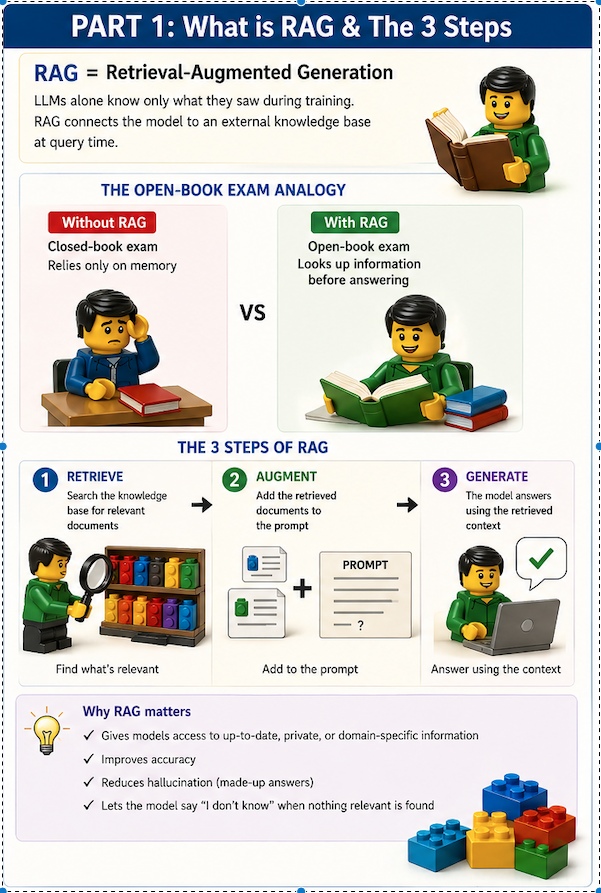

> **Healthcare safety:** RAG can improve grounding and traceability, but it does not guarantee correctness. Healthcare implementations still need approved current sources, privacy controls, citations, auditability, and human review.

In [2]:
approved_sources = [
    ("POLICY-APPT-01", "Appointment changes may be requested by phone during clinic hours."),
    ("POLICY-RECORDS-02", "Records requests are sent to the Health Information Management team."),
    ("POLICY-BILLING-03", "Billing questions are routed to Patient Financial Services."),
]

rag_stop_words = {"a", "an", "the", "is", "are", "to", "of", "for", "by", "what", "where", "how"}


def retrieve_source(question):
    """Return the approved source with the most meaningful word overlap."""
    question_words = set(simple_tokenize(question)) - rag_stop_words
    scored = []
    for source_id, text in approved_sources:
        source_words = set(simple_tokenize(text)) - rag_stop_words
        scored.append((len(question_words & source_words), source_id, text))
    best_score, source_id, text = max(scored)
    return (source_id, text) if best_score > 0 else None


def grounded_answer(question):
    """Simulate a cautious RAG answer with a source label."""
    match = retrieve_source(question)
    if match is None:
        return "I do not know based on the approved sources."
    source_id, text = match
    return f"Based on [{source_id}]: {text}"


questions = [
    "Where do records requests go?",
    "What is the visitor parking fee?",
]
for question in questions:
    print("Question:", question)
    print("Answer:  ", grounded_answer(question))
    print()

Question: Where do records requests go?
Answer:   Based on [POLICY-RECORDS-02]: Records requests are sent to the Health Information Management team.

Question: What is the visitor parking fee?
Answer:   I do not know based on the approved sources.



## RAG Demonstrated by the Healthcare Code

The picture below follows the exact behavior of the code above.

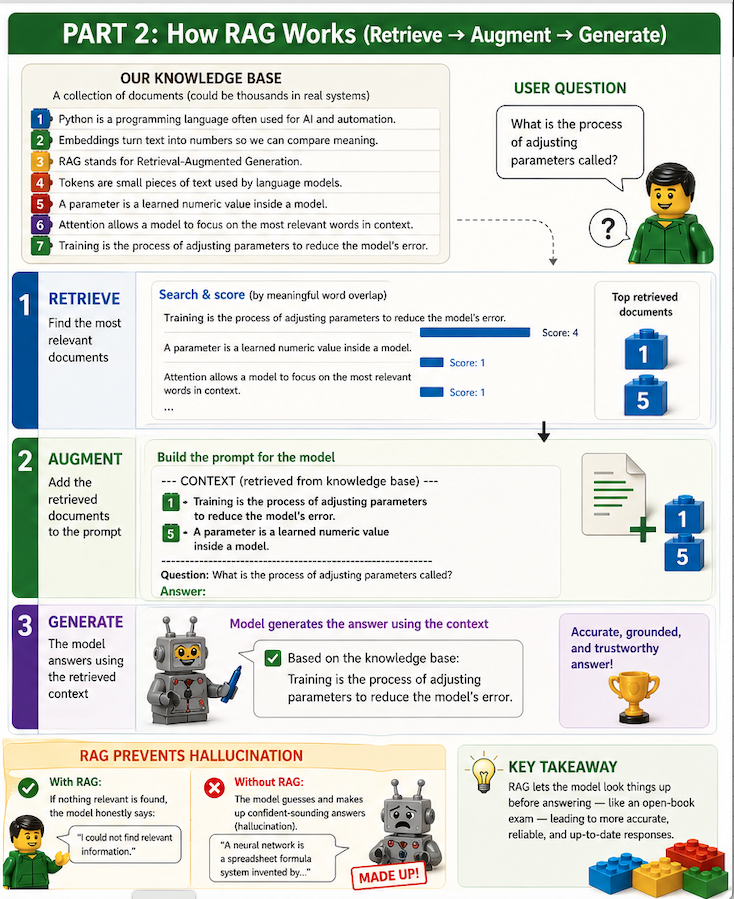



### What Happens for the Records Question

1. **Retrieve:** The question `Where do records requests go?` is compared with the three approved sources.
2. **Augment:** `POLICY-RECORDS-02` is the best match, so its text is added as approved context.
3. **Generate:** The answer repeats the approved information and includes the source label.



### What Happens When No Source Matches

For `What is the visitor parking fee?`, the code finds no meaningful overlap. It returns:

> I do not know based on the approved sources.

This fallback is important. A grounded system should admit when its approved sources do not contain an answer instead of inventing one.

> **Healthcare safety:** Retrieval can still select an outdated or incorrect source. Generation can still misstate the retrieved text. Use access controls, current approved content, citations, audit logs, and human review.

### Why RAG Matters in Practice

| Without RAG | With RAG |
|---|---|
| Model knows only training data | Model can use fresh, private documents |
| May hallucinate outdated facts | Answers are grounded in retrieved sources |
| Cannot reference your data | Can reference your internal knowledge base |
| Hard to audit | You can point to the source document |

RAG is one of the most widely deployed GenAI patterns in enterprise applications today.

---

# 8. Token and Cost Optimization — Save Cost Without Losing Quality

<div style="background:linear-gradient(135deg,#0d47a1,#1976d2);color:#ffffff;padding:24px 28px;border-radius:14px;margin:18px 0;box-shadow:0 4px 12px rgba(13,71,161,0.25);">
  <div style="font-size:1.45em;font-weight:800;margin-bottom:10px;">💰 Why token optimization matters</div>
  <div style="font-size:1.08em;line-height:1.6;">Many AI services charge for both <strong>input tokens</strong> and <strong>output tokens</strong>. Large prompts, repeated documents, long conversation histories, and unnecessarily long answers can make powerful models expensive. The goal is not to remove useful context—it is to remove waste.</div>
</div>



## A Simple Cost Mental Model

$$
\text{Estimated cost} = \text{input-token cost} + \text{output-token cost}
$$

Providers usually publish different rates for each model. More capable models and very long context windows may cost more, so always check the current pricing for the approved service your organization uses.

<div style="background:#fff8e1;border-left:7px solid #f9a825;padding:17px 21px;border-radius:10px;margin:18px 0;color:#4e342e;">
  <strong>Fictional example:</strong> Sending 100 pages of policies when only two paragraphs answer the question wastes tokens. Retrieval can select just the most relevant approved passages before the model responds.
</div>



<table style="width:100%;border-collapse:separate;border-spacing:14px 8px;margin:14px 0;">
  <tr>
    <td style="width:50%;background:#e8f5e9;border:2px solid #43a047;border-radius:12px;padding:20px;vertical-align:top;">
      <div style="color:#1b5e20;font-size:1.35em;font-weight:800;margin-bottom:12px;">✅ DO</div>
      <ul style="line-height:1.75;margin:0;padding-left:24px;color:#17324d;">
        <li><strong>State one clear goal.</strong> Ask for the exact task and audience.</li>
        <li><strong>Retrieve only relevant approved passages.</strong> Use RAG instead of sending every policy document.</li>
        <li><strong>Set an output limit.</strong> For example: “Use five bullets and no more than 150 words.”</li>
        <li><strong>Remove repeated instructions.</strong> Keep one short, reusable instruction block.</li>
        <li><strong>Summarize long histories.</strong> Keep verified decisions and remove old conversational repetition.</li>
        <li><strong>Use the smallest capable approved model.</strong> Escalate to a larger model when the task truly needs it.</li>
        <li><strong>Measure usage.</strong> Track input tokens, output tokens, cost per task, and quality.</li>
      </ul>
    </td>
    <td style="width:50%;background:#ffebee;border:2px solid #e53935;border-radius:12px;padding:20px;vertical-align:top;">
      <div style="color:#b71c1c;font-size:1.35em;font-weight:800;margin-bottom:12px;">❌ DON'T</div>
      <ul style="line-height:1.75;margin:0;padding-left:24px;color:#17324d;">
        <li><strong>Do not paste entire documents by default.</strong> First identify the sections needed.</li>
        <li><strong>Do not resend the full conversation every time.</strong> Retain only useful, verified context.</li>
        <li><strong>Do not request long prose when a table or short list works.</strong></li>
        <li><strong>Do not repeat examples.</strong> One clear example is often enough.</li>
        <li><strong>Do not use an expensive model for every simple task.</strong> Classification or formatting may need less capability.</li>
        <li><strong>Do not remove essential healthcare context only to save money.</strong> Quality and safety come first.</li>
        <li><strong>Never enter PHI into an unapproved tool.</strong> Fewer tokens do not make private data safe.</li>
      </ul>
    </td>
  </tr>
</table>



## Before and After

| Wasteful request | Token-optimized request |
|---|---|
| “Read all 100 pages of our policy library and explain everything.” | “Using the two retrieved sections about records requests, provide three routing steps in under 120 words.” |
| “Give me a very detailed response with all possible background.” | “Give the answer in five bullets. Include only actions, owner, and approved source.” |
| Re-send the complete chat history for every follow-up. | Provide a short verified summary of prior decisions plus the new question. |



<div style="background:linear-gradient(135deg,#4a148c,#7b1fa2);color:#ffffff;padding:21px 25px;border-radius:13px;margin:20px 0;box-shadow:0 4px 12px rgba(74,20,140,0.22);">
  <div style="font-size:1.25em;font-weight:800;margin-bottom:10px;">🔎 QUICK CHECK BEFORE YOU SEND</div>
  <div style="line-height:1.75;font-size:1.04em;">
    1. Is the goal clear? &nbsp; 2. Is every included document relevant? &nbsp; 3. Can repeated text be removed?<br>
    4. Is the output length specified? &nbsp; 5. Is this the smallest approved model that can safely do the task?<br>
    6. Is the content fictional, de-identified, or handled only in an approved PHI environment?
  </div>
</div>

> **Healthcare safety rule:** Optimize waste, not clinical meaning. Never omit information needed for safe interpretation, qualified review, legal compliance, or patient care merely to reduce token cost.

---
# 9. Agents, MCP, and A2A — From One AI Assistant to a Controlled Team

A normal chatbot mainly answers questions:

> **You ask → AI answers**

An **agent** can go one step further. It can examine a task, choose an approved action, use an allowed tool, and return a result for review.

<div style="background:linear-gradient(135deg,#065f46,#0f766e);border:2px solid #5eead4;border-left:9px solid #2dd4bf;padding:17px 21px;border-radius:12px;margin:18px 0;color:#f0fdfa;box-shadow:0 4px 13px rgba(0,0,0,0.34);">
  <strong style="color:#99f6e4;font-size:1.08em;">💡 Central idea:</strong> RAG gives AI approved information. MCP connects an agent to approved tools. A2A allows approved agents to work together. Humans remain responsible for the final decision.
</div>



## The Healthcare Team Analogy

Imagine a fictional healthcare administrative coordinator named Maya. She receives this request:

> “Using fictional information only, look up where records requests go, estimate 25 + 15 minutes, and propose the correct administrative route.”

Maya cannot complete every part alone, so she works with a small team:

- **Policy Agent** — looks up an approved policy.
- **Wait-Time Agent** — performs the simple calculation.
- **Routing Agent** — proposes an administrative destination.
- **Coordinator Agent** — sends work to the specialists and combines their results.
- **Human Reviewer** — checks and approves the final response.

This is a **multi-agent system**: several specialized agents cooperate on one larger task.



## RAG, MCP, and A2A in Plain Language

| Technology | Simple analogy | What it does |
|---|---|---|
| **RAG** | Approved library | Gives an agent relevant, approved information |
| **MCP** | Labeled toolbox | Describes available tools and how to use them |
| **A2A** | Secure team handoff | Allows one agent to send work to another agent |
| **Human review** | Responsible supervisor | Verifies, approves, corrects, or stops the result |



### RAG — “Where can I find trusted information?”

The Policy Agent uses RAG to retrieve the approved records policy instead of guessing.

### MCP — “Which approved tool can I use?”

MCP describes tools such as `lookup_approved_policy`, `estimate_clinic_wait`, and `propose_admin_route`. It tells an agent what each tool does, what input it expects, and its safety limits.



### A2A — “Which other agent can help me?”

**A2A means Agent-to-Agent.** It gives agents a standard way to:

1. Introduce their capabilities.
2. Receive a task from another agent.
3. Report progress or ask for clarification.
4. Return a result for review.

Think of A2A as a controlled referral or handoff between members of a healthcare administrative team.

<div style="background:#172033;border-left:7px solid #a78bfa;padding:14px 18px;border-radius:10px;margin:16px 0;color:#ede9fe;">
  <strong>Important distinction:</strong> MCP connects an agent to a <strong>tool</strong>. A2A connects an agent to <strong>another agent</strong>.
</div>



## How the Controlled Team Works





## Improved Classroom Demonstration

The next code cell uses:

1. **Three specialist Agent Cards** — each clearly states one capability.
2. **An A2A handoff function** — the Coordinator delegates work to the right specialist.
3. **An MCP tool registry** — each specialist uses only its approved tool.
4. **A structured request** — all three parts are completed instead of selecting only one.
5. **A safe stop** — unknown work is sent to human review rather than an unrelated fallback.



## Safety Boundaries

- Share only the minimum information needed between agents.
- Never send PHI to an unauthorized agent or tool.
- Give each agent only the permissions required for its job.
- Record tool calls, agent handoffs, sources, and results.
- Require human approval before routing or operational action.
- Treat every agent response as a draft until verified.

<div style="background:#172033;border-left:7px solid #fbbf24;padding:14px 18px;border-radius:10px;margin:16px 0;color:#fef3c7;">
  <strong>Final takeaway:</strong> A multi-agent system should work like a controlled team—not a group of unsupervised bots. Every agent needs a clear job, limited permissions, approved tools, traceable handoffs, and human oversight.
</div>

In [5]:
# ============================================================
# SECTION 9 — AGENTS, MCP, AND A2A
# ============================================================
# This is a transparent classroom simulation:
#   A2A = agent-to-agent handoff
#   MCP = agent-to-approved-tool connection
# All information and actions below are fictional.
# ============================================================


# ---- Step 1: Approved Administrative Tools ----

def lookup_approved_policy(question):
    """Use the fictional RAG library created in Section 7."""
    return grounded_answer(question)


def estimate_clinic_wait(current_wait, added_minutes):
    """Add two fictional administrative wait-time values."""
    if current_wait < 0 or added_minutes < 0:
        return "Wait-time values must be zero or greater."
    return f"{current_wait + added_minutes} fictional minutes"


def propose_admin_route(request_type):
    """Propose a destination without performing a real action."""
    routes = {
        "records": "Health Information Management",
        "billing": "Patient Financial Services",
        "appointment": "Scheduling",
    }
    destination = routes.get(request_type.lower())
    if destination is None:
        return "No approved route found. Send to human review."
    return f"Proposed route: {destination}"


# ---- Step 2: MCP-Style Tool Registry ----

MCP_TOOLS = {
    "lookup_approved_policy": {
        "function": lookup_approved_policy,
        "safety": "Approved sources only; no real patient information",
        "approval_required": False,
    },
    "estimate_clinic_wait": {
        "function": estimate_clinic_wait,
        "safety": "Teaching estimate only; not an operational prediction",
        "approval_required": False,
    },
    "propose_admin_route": {
        "function": propose_admin_route,
        "safety": "Proposal only; human approval required",
        "approval_required": True,
    },
}


# ---- Step 3: A2A-Style Agent Cards ----
# Each card advertises one capability and one allowed MCP tool.

AGENT_CARDS = {
    "policy-agent": {
        "capability": "approved-policy-lookup",
        "description": "Find source-labeled administrative policy text",
        "allowed_tool": "lookup_approved_policy",
    },
    "wait-time-agent": {
        "capability": "fictional-wait-calculation",
        "description": "Calculate a fictional administrative wait value",
        "allowed_tool": "estimate_clinic_wait",
    },
    "routing-agent": {
        "capability": "administrative-route-proposal",
        "description": "Propose a non-clinical administrative destination",
        "allowed_tool": "propose_admin_route",
    },
}


def discover_agent(capability):
    """Find an approved specialist advertising the needed capability."""
    for agent_name, card in AGENT_CARDS.items():
        if card["capability"] == capability:
            return agent_name
    return None


def send_a2a_task(task):
    """Simulate a traceable handoff from the Coordinator to a specialist."""
    target = task["to_agent"]
    print(f"   A2A → {target}")
    print(f"      Task ID: {task['task_id']}")
    print(f"      Request: {task['message']}")

    if target not in AGENT_CARDS:
        return {
            "status": "needs-human-review",
            "artifact": "No approved specialist was found.",
            "approval_required": True,
        }

    tool_name = AGENT_CARDS[target]["allowed_tool"]
    tool = MCP_TOOLS[tool_name]
    print(f"      MCP → {tool_name}")
    print(f"      Safety: {tool['safety']}")
    result = tool["function"](**task["arguments"])
    return {
        "status": "completed",
        "artifact": result,
        "approval_required": tool["approval_required"],
    }


# ---- Step 4: Coordinator Delegation Plan ----

def coordinator_agent(request):
    """Delegate all three subtasks and prepare a reviewable draft."""
    plan = [
        (
            "approved-policy-lookup",
            "Find the approved records-request policy.",
            {"question": request["policy_question"]},
        ),
        (
            "fictional-wait-calculation",
            "Calculate the two fictional wait-time values.",
            {
                "current_wait": request["current_wait"],
                "added_minutes": request["added_minutes"],
            },
        ),
        (
            "administrative-route-proposal",
            "Propose an administrative destination.",
            {"request_type": request["request_type"]},
        ),
    ]

    print("📥 COORDINATOR RECEIVED A FICTIONAL REQUEST")
    print(f"   {request['summary']}\n")
    results = []

    for number, (capability, message, arguments) in enumerate(plan, start=1):
        target = discover_agent(capability)
        task = {
            "task_id": f"A2A-{number:03d}",
            "from_agent": "coordinator-agent",
            "to_agent": target or "human-review",
            "message": message,
            "arguments": arguments,
        }
        response = send_a2a_task(task)
        results.append(response)
        print(f"      Result: {response['artifact']}\n")

    print("=" * 72)
    print("📋 COORDINATOR'S COMBINED DRAFT")
    for number, result in enumerate(results, start=1):
        print(f"   {number}. {result['artifact']}")

    if any(result["approval_required"] for result in results):
        print("\n🛑 FINAL STATUS: HUMAN REVIEW AND APPROVAL REQUIRED")
    else:
        print("\n👤 FINAL STATUS: READY FOR HUMAN REVIEW")

    print("   No real PHI was used and no clinical or operational action occurred.")
    return results


# ---- Run One Clear Multi-Agent Example ----

fictional_request = {
    "summary": (
        "Look up where records requests go, estimate 25 + 15 minutes, "
        "and propose the correct administrative route."
    ),
    "policy_question": "Where do records requests go?",
    "current_wait": 25,
    "added_minutes": 15,
    "request_type": "records",
}

coordinator_agent(fictional_request)


print("\n💡 KEY INSIGHT")
print("   A2A connected the Coordinator to specialist agents.")
print("   MCP connected each specialist to one approved tool.")
print("   RAG supplied source-labeled policy information.")
print("   A human still controls any consequential next step.")

📥 COORDINATOR RECEIVED A FICTIONAL REQUEST
   Look up where records requests go, estimate 25 + 15 minutes, and propose the correct administrative route.

   A2A → policy-agent
      Task ID: A2A-001
      Request: Find the approved records-request policy.
      MCP → lookup_approved_policy
      Safety: Approved sources only; no real patient information
      Result: Based on [POLICY-RECORDS-02]: Records requests are sent to the Health Information Management team.

   A2A → wait-time-agent
      Task ID: A2A-002
      Request: Calculate the two fictional wait-time values.
      MCP → estimate_clinic_wait
      Safety: Teaching estimate only; not an operational prediction
      Result: 40 fictional minutes

   A2A → routing-agent
      Task ID: A2A-003
      Request: Propose an administrative destination.
      MCP → propose_admin_route
      Safety: Proposal only; human approval required
      Result: Proposed route: Health Information Management

📋 COORDINATOR'S COMBINED DRAFT
   1. B

---
# 10. Safe Prompting, Privacy, and Output Review

A clear prompt states the task, the allowed source, the audience, and the required format.

**Vague:** “Summarize this.”

**Clearer:** “Using only the fictional note below, create three plain-language bullets for staff training. Mark missing information as unknown. Do not add a diagnosis or recommendation.”



Before using any approved AI system:

1. Check whether the content contains PHI or other sensitive data.
2. Use the minimum necessary information.
3. Confirm the tool is approved for that data.
4. Require the output to cite supplied sources and state uncertainty.
5. Have an accountable healthcare professional verify the result.

> **Safety check:** A simple detector can miss identifiers. It is only a classroom demonstration, not a privacy solution.

In [31]:
def basic_privacy_screen(text):
    """Detect a few obvious placeholder identifiers for classroom use only."""
    patterns = {
        "email": r"\b[\w.-]+@[\w.-]+\.\w+\b",
        "phone-like number": r"\b\d{3}[- ]\d{3}[- ]\d{4}\b",
        "medical record number label": r"\bMRN\s*[:#]?\s*\d+\b",
    }
    return [label for label, pattern in patterns.items() if re.search(pattern, text, re.I)]


def review_output(text, source_label=None):
    """Apply a tiny review checklist to a draft response."""
    return {
        "has_source": bool(source_label),
        "states_uncertainty": "do not know" in text.lower() or "unknown" in text.lower(),
        "requires_human_review": True,
        "clear_length": len(text.split()) <= 40,
    }

safe_example = "Patient A requests a fictional appointment change."
unsafe_example = "Send details to example.person@example.org"

for example in (safe_example, unsafe_example):
    findings = basic_privacy_screen(example)
    print(example)
    print("BLOCK" if findings else "No simple pattern found", findings)
    print()

sample_draft = "I do not know based on the approved sources."
print("Output checklist:", review_output(sample_draft, source_label="POLICY-LIBRARY"))
print("Professional verification is still required.")

Patient A requests a fictional appointment change.
No simple pattern found []

Send details to example.person@example.org
BLOCK ['email']

Output checklist: {'has_source': True, 'states_uncertainty': True, 'requires_human_review': True, 'clear_length': True}
Professional verification is still required.


---
# 11. The Full Picture





| Concept | Simple healthcare meaning |
|---|---|
| Tokens | Small text pieces from a fictional message or note |
| Token IDs | Number labels for those pieces |
| Embeddings | Numeric representations used to compare meaning |
| Attention | Context-dependent focus between tokens |
| Parameters | Learned numeric settings used for predictions |
| Next-token prediction | Repeatedly choosing likely text |
| Training | Adjusting parameters to reduce error on examples |
| RAG | Adding retrieved approved sources to a prompt |
| Agent | Choosing a tool or step for a task |
| MCP | A standard description of available tools |

**Remember:** A polished answer is still a draft until its facts, source, context, privacy, and intended use are checked.

---
# 12. Five Mini Challenges

Use fictional data only.

1. **Tokens:** Change the appointment sentence and compare the token count.
2. **Parameters:** Change the toy `weight` and `bias`. Observe how the non-clinical output changes.
3. **Similarity:** Add “reschedule my appointment” to the phrase list. Which phrase is most similar in the word-count demo?
4. **Attention:** Add a word to the fictional sentence and assign it a hand-written attention score.
5. **RAG and safety:** Add a fictional, labeled administrative policy. Ask one question it answers and one it cannot answer. Check that the second response says it does not know.

**Discussion:** For each challenge, identify where privacy screening, source verification, bias review, access controls, audit logging, and human approval belong.

---
# 13. Final Takeaway

LLMs can help draft, organize, retrieve, and transform language. They can also hallucinate, omit context, expose sensitive information, and reproduce bias. Healthcare professionals remain accountable for how outputs are checked and used.



## Before using an LLM in healthcare

- [ ] **Protect PHI:** Use only approved tools and the minimum necessary data.
- [ ] **Verify sources:** Check that citations are real, current, applicable, and accurately represented.
- [ ] **Expect errors:** Fluency is not evidence; test edge cases and uncertainty.
- [ ] **Check bias:** Evaluate performance across relevant populations and workflows.
- [ ] **Keep humans accountable:** Require qualified review for clinical or consequential use.
- [ ] **Control access:** Apply role-based permissions and least privilege.
- [ ] **Keep an audit trail:** Record sources, tool calls, reviews, and approvals as required by policy.

> **Final safety message:** This notebook is educational only. It does not provide medical advice and must not be used for diagnosis, treatment, medication dosing, or real patient care.

<style id="workshop-presentation-style">
/* Layout only. Lesson text, figures, code, and outputs are unmodified. */
@page {
  size: 16in 9in;
  margin: 0.45in;
}
/* Used by HTML exports; :has also covers notebook viewers without tag classes. */
.celltag_workshop-layout,
.jp-Cell:has(#workshop-presentation-style),
.cell:has(#workshop-presentation-style) {
  display: none !important;
}
@media screen {
  main > .jp-Cell,
  .jp-Notebook > .jp-Cell,
  #notebook-container > .cell {
    max-width: 1280px;
    margin: 0 auto 48px;
    padding: 28px 20px 36px;
    border-bottom: 2px solid #94a3b8;
    box-sizing: border-box;
  }
  main > .jp-MarkdownCell,
  .jp-Notebook > .jp-MarkdownCell,
  #notebook-container > .text_cell {
    min-height: min(56.25vw, 720px);
  }
}
.jp-RenderedMarkdown,
.text_cell_render {
  font-size: 22px;
  line-height: 1.45;
}
.jp-RenderedMarkdown h1, .text_cell_render h1 { font-size: 1.65em; }
.jp-RenderedMarkdown h2, .text_cell_render h2 { font-size: 1.4em; }
.jp-RenderedMarkdown h3, .text_cell_render h3 { font-size: 1.2em; }
.jp-RenderedMarkdown table, .text_cell_render table { font-size: 0.88em; }
.jp-RenderedMarkdown img, .text_cell_render img {
  display: block;
  max-width: 100%;
  max-height: 580px;
  width: auto;
  height: auto;
  margin: 16px auto;
  object-fit: contain;
}
.jp-RenderedMarkdown svg, .text_cell_render svg {
  display: block;
  width: 100%;
  height: auto;
  max-height: 580px;
  margin: 0 auto;
}
/* Preserve complete code and output; scroll only if a slideshow viewport needs it. */
.reveal .slides { text-align: left; }
.reveal .slides section .jp-Cell { margin: 0; padding: 0; }
.reveal .slides section .jp-CodeCell {
  max-height: 72vh;
  overflow: auto;
}
.reveal .slides section .jp-RenderedMarkdown { font-size: 22px; }
.reveal .slides section .jp-RenderedMarkdown h1 { font-size: 36px; }
.reveal .slides section .jp-RenderedMarkdown h2 { font-size: 30px; }
.reveal .slides section .jp-RenderedMarkdown h3 { font-size: 26px; }
.reveal .slides section img { max-height: 58vh; }
.reveal .slides section svg { max-height: 55vh; }
@media print {
  html, body, main, #notebook, #notebook-container, .jp-Notebook {
    width: auto !important;
    height: auto !important;
    min-height: 0 !important;
    margin: 0 !important;
    padding: 0 !important;
    overflow: visible !important;
    background: white !important;
    color: #172033 !important;
  }
  * {
    -webkit-print-color-adjust: exact !important;
    print-color-adjust: exact !important;
  }
  main > .jp-Cell,
  .jp-Notebook > .jp-Cell,
  #notebook-container > .cell {
    display: block !important;
    break-before: page;
    page-break-before: always;
    break-inside: auto !important;
    page-break-inside: auto !important;
    width: 100% !important;
    max-width: none !important;
    height: auto !important;
    min-height: 0 !important;
    margin: 0 !important;
    padding: 0 !important;
    border: 0 !important;
    box-sizing: border-box;
  }
  main > .jp-Cell:first-child,
  .jp-Notebook > .jp-Cell:first-child,
  #notebook-container > .cell:first-child {
    break-before: auto;
    page-break-before: auto;
  }
  main > .jp-Cell:has(#workshop-presentation-style),
  .jp-Notebook > .celltag_workshop-layout,
  .jp-Notebook > .jp-Cell:has(#workshop-presentation-style),
  #notebook-container > .cell:has(#workshop-presentation-style) {
    display: none !important;
  }
  .jp-Cell-inputWrapper, .jp-Cell-outputWrapper,
  .jp-InputArea, .jp-OutputArea, .jp-OutputArea-child,
  .jp-OutputArea-output, .jp-RenderedText,
  .input, .inner_cell, .input_area, .output_wrapper, .output, .output_area, .output_subarea {
    display: block !important;
    height: auto !important;
    max-height: none !important;
    overflow: visible !important;
    break-inside: auto !important;
    page-break-inside: auto !important;
  }
  .jp-InputPrompt, .jp-OutputPrompt, .prompt,
  .jp-InputCollapser, .jp-OutputCollapser {
    display: none !important;
  }
  .jp-RenderedMarkdown, .text_cell_render {
    padding: 0 !important;
    font-size: 22px !important;
    line-height: 1.4 !important;
  }
  .jp-RenderedMarkdown > :first-child,
  .text_cell_render > :first-child { margin-top: 0 !important; }
  pre, .jp-CodeMirrorEditor pre, .highlight pre {
    white-space: pre-wrap !important;
    overflow-wrap: anywhere;
    font-size: 16px !important;
    line-height: 1.35 !important;
    max-height: none !important;
    overflow: visible !important;
    break-inside: auto !important;
    page-break-inside: auto !important;
  }
  .jp-RenderedMarkdown > :last-child,
  .text_cell_render > :last-child { margin-bottom: 0 !important; }
  .jp-RenderedMarkdown:has(blockquote) img,
  .text_cell_render:has(blockquote) img { max-height: 520px; }
  h1, h2, h3 { break-after: avoid-page; }
  img, svg, tr { break-inside: avoid-page; }
}
</style>